In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import folium
from folium import plugins
from folium.plugins import HeatMap
import math
from sklearn.preprocessing import LabelEncoder

# 1. Census Income Data

This dataset gives us information about people whose income was either greater than 50K or less than or 
equal to 50K. We can use the information provided to predict whether a given individual will have income in
which bracket. The dataset consists of mainly 3 kinds of data:

**Categorical:** workclass, education, marital-status, occupation, relationship, race, gender, native-country, 
income  
**Numerical:** fnlwgt, capital-gain, capital-loss, hours-per-week  
**Ordinal:** education-num

In [2]:
df = pd.read_csv('census_income_data.csv')

In [3]:
df.head()

,age,workclass,fnlwgt,education,educational-num,marital-status,occupation,relationship,race,gender,capital-gain,capital-loss,hours-per-week,native-country,income
0,25,Private,226802,11th,7,Never-married,Machine-op-inspct,Own-child,Black,Male,0,0,40,United-States,<=50K
1,38,Private,89814,HS-grad,9,Married-civ-spouse,Farming-fishing,Husband,White,Male,0,0,50,United-States,<=50K
2,28,Local-gov,336951,Assoc-acdm,12,Married-civ-spouse,Protective-serv,Husband,White,Male,0,0,40,United-States,>50K
3,44,Private,160323,Some-college,10,Married-civ-spouse,Machine-op-inspct,Husband,Black,Male,7688,0,40,United-States,>50K
4,18,?,103497,Some-college,10,Never-married,?,Own-child,White,Female,0,0,30,United-States,<=50K


## 1.1

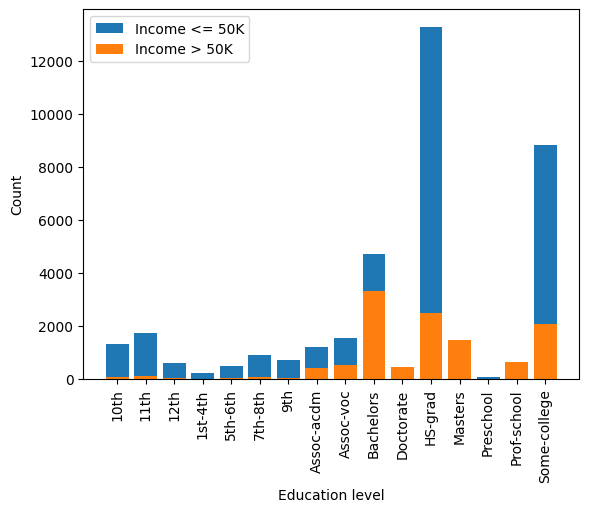

In [4]:
y = df[df['income']=='<=50K'].groupby('education').size()
x = y.index
plt.bar(x, y, label = 'Income <= 50K')
y2 = df[df['income']=='>50K'].groupby('education').size()
x2 = y2.index
plt.bar(x2, y2, label = 'Income > 50K')
plt.ylabel('Count')
plt.xlabel('Education level')
plt.xticks(rotation='vertical')
plt.legend()
plt.show()

**Observations:**
1. In people with income <=50K, the highest number is that of HS-grad, followed by some-college and Bachelors.
2. In people with income >50K, the highest number is that of Bachelors, followed by HS-grad and some-college.
3. There are comparitively fewer people with Masters, Doctorate and Prof-school degree and almost all of those people have income >50K, implying that people with higher educational level tends to earn better income.
4. There are few cases where people with lower educational levels like 10th, 11th, etc. are earning >50K.

## 1.2

In [5]:
df[(df['income']=='>50K') & (df['hours-per-week']<=40)].groupby('occupation').size()

occupation
?                     195
Adm-clerical          567
Armed-Forces            3
Craft-repair          812
Exec-managerial      1149
Farming-fishing        49
Handlers-cleaners      99
Machine-op-inspct     247
Other-service         138
Priv-house-serv         3
Prof-specialty       1429
Protective-serv       179
Sales                 577
Tech-support          296
Transport-moving      202
dtype: int64

In [6]:
df[(df['income']=='>50K') & (df['hours-per-week']<=40)].groupby('education').size()

education
10th              50
11th              55
12th              30
1st-4th            3
5th-6th           18
7th-8th           32
9th               20
Assoc-acdm       217
Assoc-voc        300
Bachelors       1579
Doctorate        173
HS-grad         1449
Masters          667
Preschool          1
Prof-school      209
Some-college    1142
dtype: int64

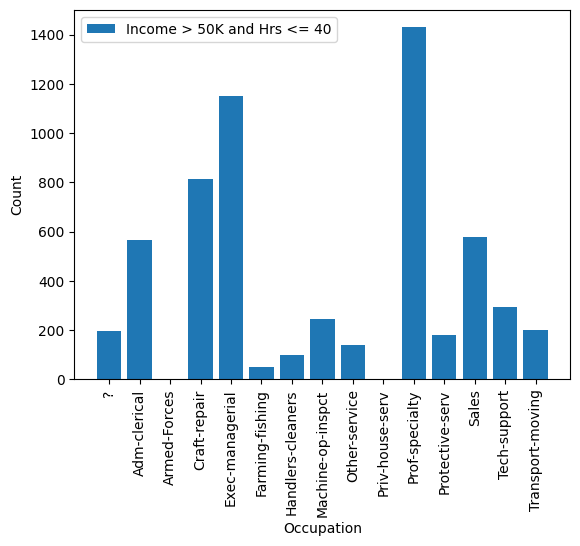

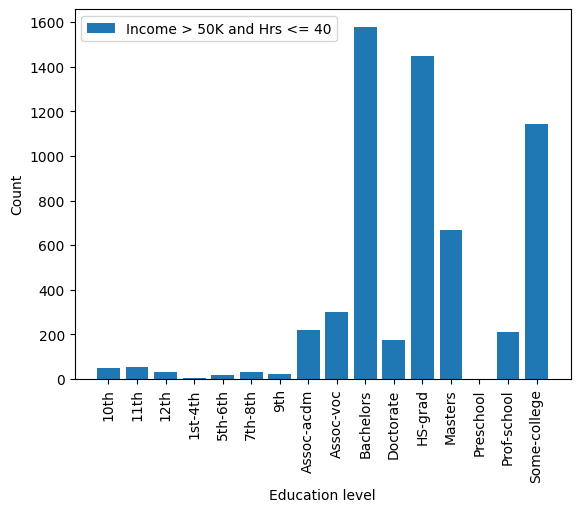

In [7]:
y = df[(df['income']=='>50K') & (df['hours-per-week']<=40)].groupby('occupation').size()
x = y.index
plt.bar(x, y, label = 'Income > 50K and Hrs <= 40')
plt.ylabel('Count')
plt.xlabel('Occupation')
plt.xticks(rotation='vertical')
plt.legend()
plt.show()

y = df[(df['income']=='>50K') & (df['hours-per-week']<=40)].groupby('education').size()
x = y.index
plt.bar(x, y, label = 'Income > 50K and Hrs <= 40')
plt.ylabel('Count')
plt.xlabel('Education level')
plt.xticks(rotation='vertical')
plt.legend()
plt.show()

**Observations:**
1. The most common occupation for the people who earned more than 50K and earned less than or equal to 40 hrs is Prof-specialty, followed by Exec-managerial and Craft-repair. There are other occupations as well that falls in this category (refer first plot for the list), but these 3 are the most common.
2. The most common educational level for the people who earned more than 50K and earned less than or equal to 40 hrs is Bachelors, followed by HS-grad, Some-college and Masters.

## 1.3

In [8]:
total_male_count = df[df['gender']=='Male'].shape[0]

In [9]:
total_female_count = df[df['gender']=='Female'].shape[0]

In [10]:
df[df['income']=='<=50K'].groupby('gender').size()

gender
Female    14423
Male      22732
dtype: int64

In [11]:
df[df['income']=='>50K'].groupby('gender').size()

gender
Female    1769
Male      9918
dtype: int64

In [12]:
# Percent of female in >50K income bracket>
(df[df['income']=='>50K'].groupby('gender').size()['Female'] / total_female_count) * 100

10.925148221343873

In [13]:
# Percent of male in >50K income bracket>
(df[df['income']=='>50K'].groupby('gender').size()['Male'] / total_male_count) * 100

30.37672281776417

**Observations**
From the above calculations we can see that out of all the females whose income was recorded, 10% of them earn more than 50K, whereas out of all the males whose income was recorded, 30% of them earn more than 50K. So, we can say that proportion of males earning more than 50K is greater than that of females.

## 1.4

# 2. Crime Data

This dataset gives us information about different kinds of crimes taking place in different locations, the place where they occurred, the time when they occured, etc. This data can be used for getting insights like clustering the locations with highest crimes, etc. The different kinds of data seen in the dataset are: numeric, categorical.

In [14]:
df_crime = pd.read_csv('crime.csv', encoding='windows-1254')
df_crime.head()

,INCIDENT_NUMBER,OFFENSE_CODE,OFFENSE_CODE_GROUP,OFFENSE_DESCRIPTION,DISTRICT,REPORTING_AREA,SHOOTING,OCCURRED_ON_DATE,YEAR,MONTH,DAY_OF_WEEK,HOUR,UCR_PART,STREET,Lat,Long,Location
0,I182070945,619,Larceny,LARCENY ALL OTHERS,D14,808,NaN,2018-09-02 13:00:00,2018,9,Sunday,13,Part One,LINCOLN ST,42.357791,-71.139371,"(42.35779134, -71.13937053)"
1,I182070943,1402,Vandalism,VANDALISM,C11,347,NaN,2018-08-21 00:00:00,2018,8,Tuesday,0,Part Two,HECLA ST,42.306821,-71.060300,"(42.30682138, -71.06030035)"
2,I182070941,3410,Towed,TOWED MOTOR VEHICLE,D4,151,NaN,2018-09-03 19:27:00,2018,9,Monday,19,Part Three,CAZENOVE ST,42.346589,-71.072429,"(42.34658879, -71.07242943)"
3,I182070940,3114,Investigate Property,INVESTIGATE PROPERTY,D4,272,NaN,2018-09-03 21:16:00,2018,9,Monday,21,Part Three,NEWCOMB ST,42.334182,-71.078664,"(42.33418175, -71.07866441)"
4,I182070938,3114,Investigate Property,INVESTIGATE PROPERTY,B3,421,NaN,2018-09-03 21:05:00,2018,9,Monday,21,Part Three,DELHI ST,42.275365,-71.090361,"(42.27536542, -71.09036101)"


In [15]:
df_offense_codes = pd.read_csv('offense_codes.csv', header=0, names=['OFFENSE_CODE', 'OFFENSE_NAME'], 
                               encoding='windows-1254')
# df_offense_codes['OFFENSE_NAME'].unique()

In [16]:
df_crimes_final = pd.merge(df_crime, df_offense_codes, how='inner', on='OFFENSE_CODE')
df_crimes_final.shape

(577880, 18)

## 2.1

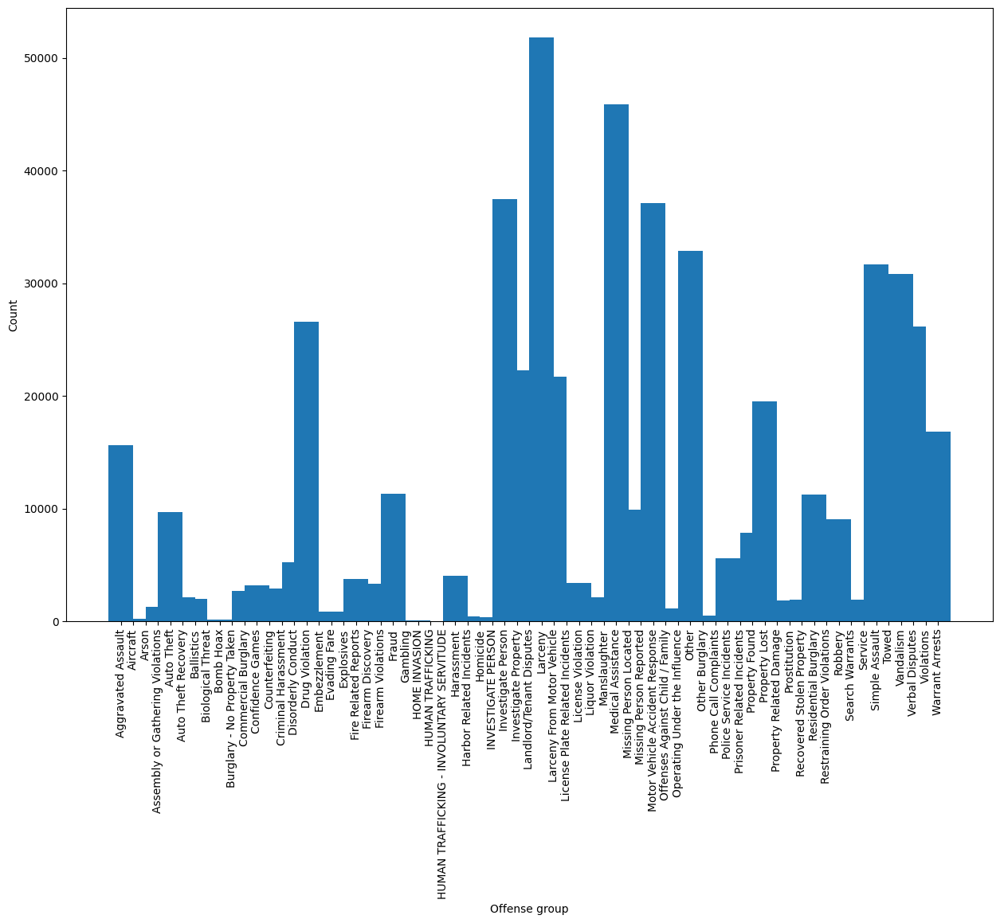

In [18]:
y = df_crimes_final.groupby('OFFENSE_CODE_GROUP').size()
x = y.index
plt.bar(x, y, width=2)
plt.ylabel('Count')
plt.xlabel('Offense group')
plt.xticks(rotation='vertical')
plt.rcParams["figure.figsize"] = (15, 12)
# plt.legend()
plt.show()

**Observations**
As seen from the bar plot, larceny is the most common type of crime Boston Police Department has to handle.

## 2.2

In [19]:
df_crimes_final[df_crimes_final['OFFENSE_CODE_GROUP']=='Motor Vehicle Accident Response']['STREET'].value_counts()[:10]


BLUE HILL AVE          1246
WASHINGTON ST          1130
DORCHESTER AVE          814
CENTRE ST               616
COMMONWEALTH AVE        611
COLUMBIA RD             558
HYDE PARK AVE           533
MASSACHUSETTS AVE       524
ADAMS ST                432
AMERICAN LEGION HWY     415
Name: STREET, dtype: int64

**Observation**  
BLUE HILL AVE has the most number of motor vehicle accidents.

## 2.3

In [20]:
df_crimes_final[['Lat', 'Long']]

,Lat,Long
0,42.357791,-71.139371
1,42.357791,-71.139371
2,42.301546,-71.081182
3,42.301546,-71.081182
4,42.321987,-71.062807
...,...,...
577875,NaN,NaN
577876,42.314334,-71.097914
577877,NaN,NaN
577878,42.352418,-71.065255


In [21]:
mp = folium.Map(location=(42.3601, 71.0589))
map_data = []
for _, row in df_crimes_final[['Lat', 'Long']].iterrows():
    if math.isnan(row[0]) or math.isnan(row[1]):
        continue
    map_data.append([row[0], row[1]])
HeatMap(map_data).add_to(mp)
mp

## 2.4

#### Distribution of crime with respect to time

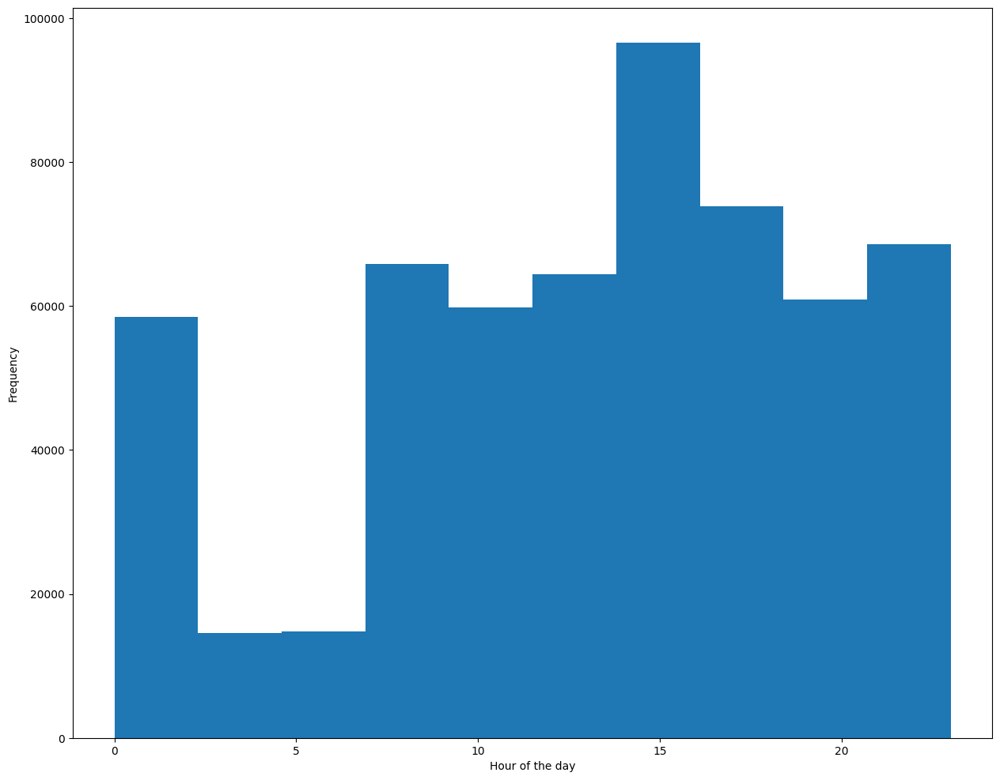

In [22]:
plt.hist(df_crimes_final['HOUR'])
plt.xlabel('Hour of the day')
plt.ylabel('Frequency')
plt.show()

#### Distribution of crime with respect to day

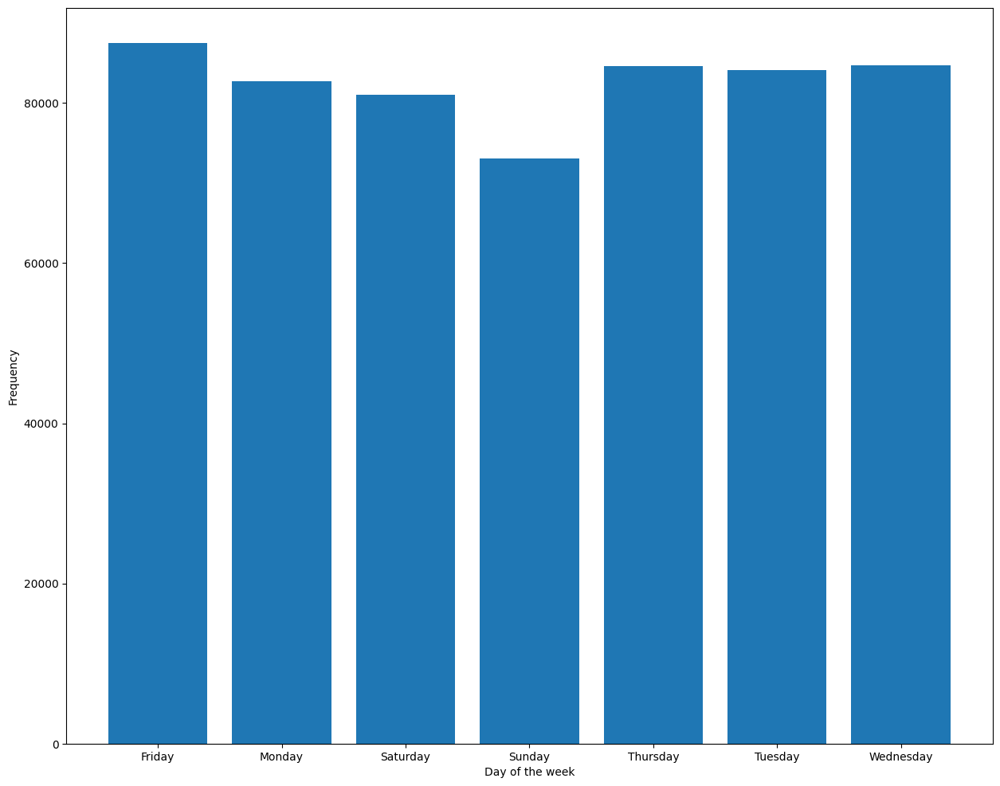

In [23]:
y = df_crimes_final.groupby('DAY_OF_WEEK').size()
x = y.index
plt.bar(x, y)
plt.xlabel('Day of the week')
plt.ylabel('Frequency')
plt.show()

#### Distribution of crime with respect to month

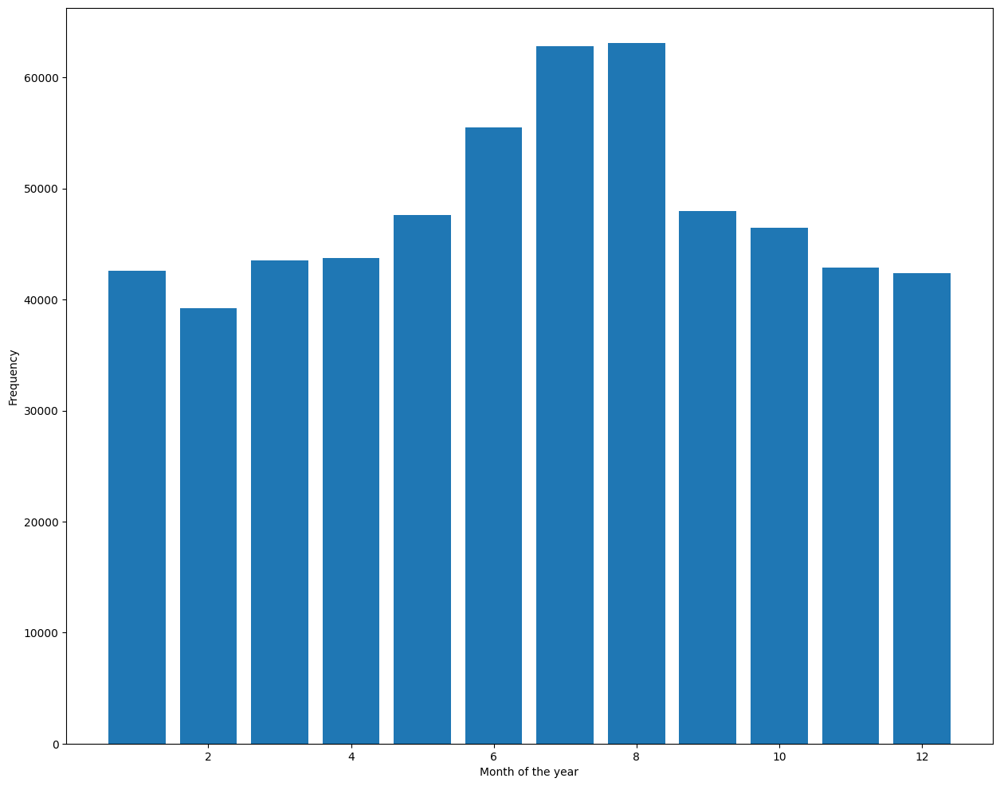

In [24]:
y = df_crimes_final.groupby('MONTH').size()
x = y.index
plt.bar(x, y)
plt.xlabel('Month of the year')
plt.ylabel('Frequency')
plt.show()

# 3. Drug Consumption Data

This dataset gives us details about the usage of various drugs among different people. We can use this dataset to analyze what kind of drugs are most commonly used by people, does other attributes such as education, gender, age, etc. has any affect on this, etc. The dataset has following kinds of data types: Numerical, Categorical and Ordinal.

In [25]:
df_drug_consumption = pd.read_csv('drug_consumption_data.csv')
df_drug_consumption.dropna()
df_drug_consumption.head()

,ID,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,AScore,...,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
0,2,25-34,M,Doctorate degree,UK,White,-0.67825,1.93886,1.43533,0.76096,...,CL4,CL0,CL2,CL0,CL2,CL3,CL0,CL4,CL0,CL0
1,3,35-44,M,Professional certificate/ diploma,UK,White,-0.46725,0.80523,-0.84732,-1.62090,...,CL0,CL0,CL0,CL0,CL0,CL0,CL1,CL0,CL0,CL0
2,4,18-24,F,Masters degree,UK,White,-0.14882,-0.80615,-0.01928,0.59042,...,CL0,CL0,CL2,CL0,CL0,CL0,CL0,CL2,CL0,CL0
3,5,35-44,F,Doctorate degree,UK,White,0.73545,-1.63340,-0.45174,-0.30172,...,CL1,CL0,CL0,CL1,CL0,CL0,CL2,CL2,CL0,CL0
4,6,65+,F,Left school at 18 years,Canada,White,-0.67825,-0.30033,-1.55521,2.03972,...,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL6,CL0,CL0


## 3.1

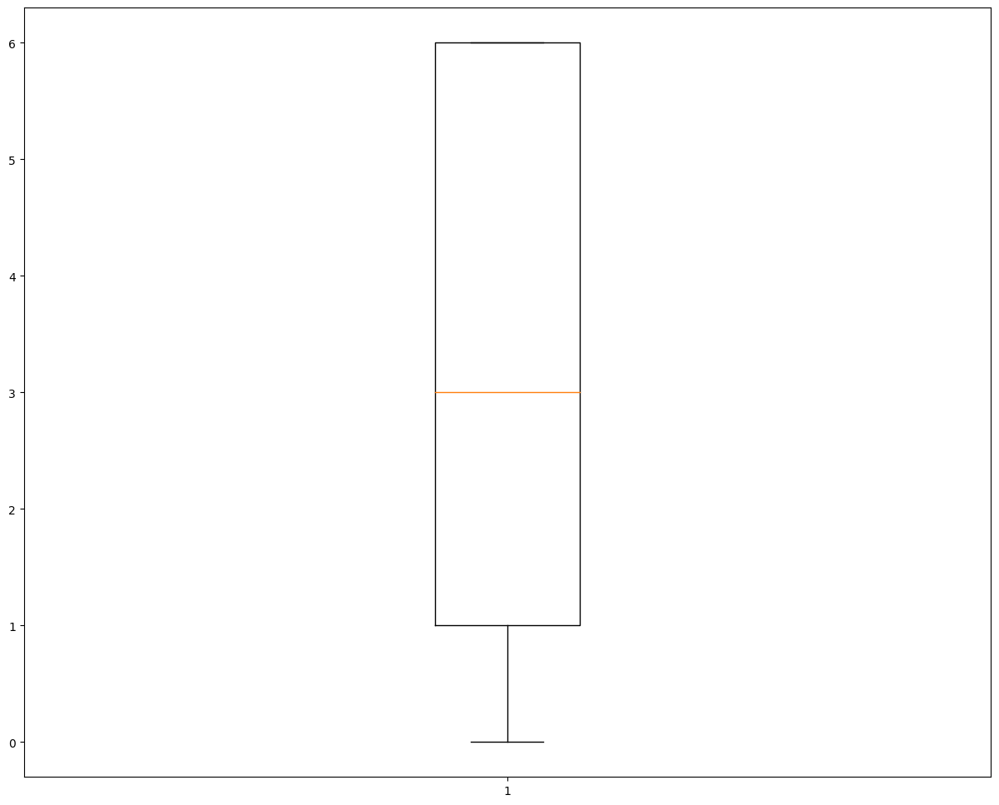

,Nicotine,Nicotine_encoded
0,CL4,4
1,CL0,0
2,CL2,2
4,CL6,6
12,CL1,1
19,CL3,3
33,CL5,5


In [26]:
labelEncoder = LabelEncoder()
df_drug_consumption['Nicotine_encoded'] = labelEncoder.fit_transform(df_drug_consumption['Nicotine'])
plt.boxplot(df_drug_consumption['Nicotine_encoded'])
plt.show()
df_drug_consumption[['Nicotine', 'Nicotine_encoded']].drop_duplicates()

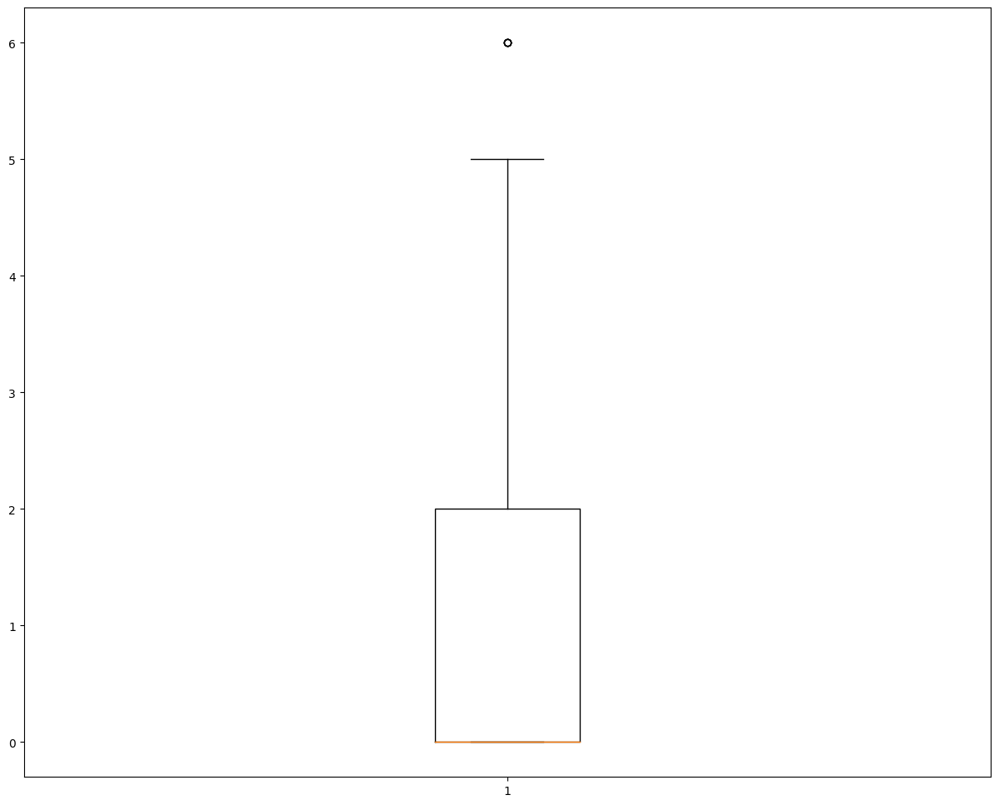

,Mushrooms,Mushrooms_encoded
0,CL0,0
1,CL1,1
3,CL2,2
26,CL3,3
425,CL4,4
653,CL5,5
726,CL6,6


In [27]:
labelEncoder = LabelEncoder()
df_drug_consumption['Mushrooms_encoded'] = labelEncoder.fit_transform(df_drug_consumption['Mushrooms'])
plt.boxplot(df_drug_consumption['Mushrooms_encoded'])
plt.show()
df_drug_consumption[['Mushrooms', 'Mushrooms_encoded']].drop_duplicates()

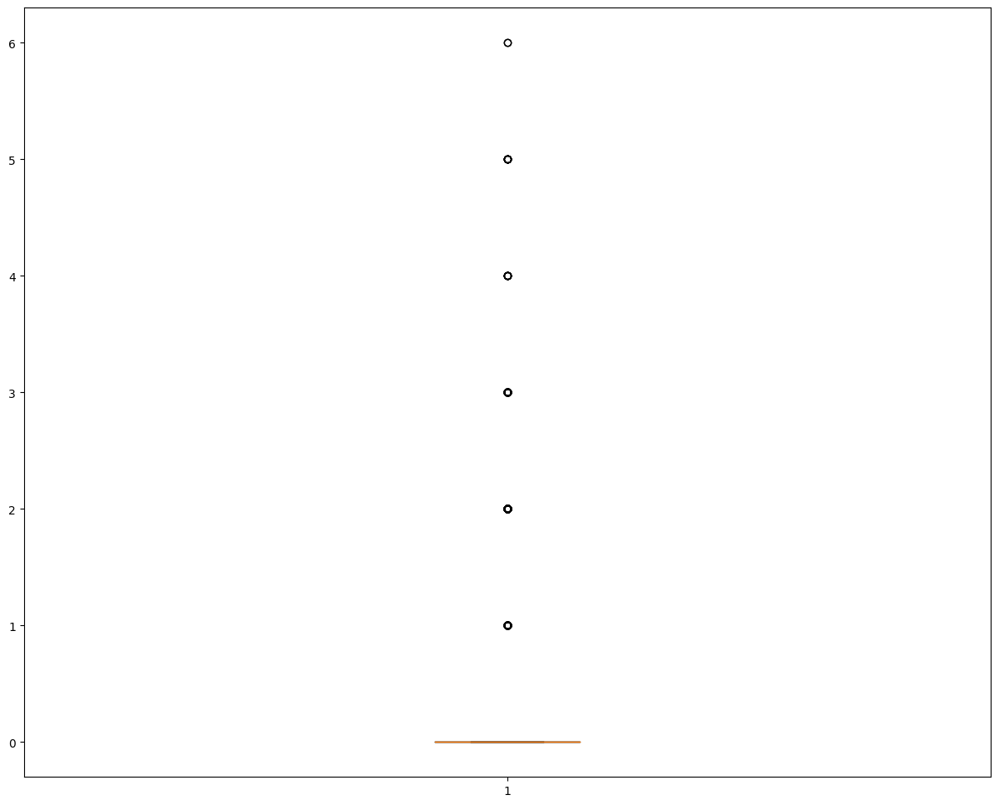

,Crack,Crack_encoded
0,CL0,0
33,CL1,1
57,CL2,2
165,CL3,3
434,CL5,5
645,CL4,4
1337,CL6,6


In [28]:
labelEncoder = LabelEncoder()
df_drug_consumption['Crack_encoded'] = labelEncoder.fit_transform(df_drug_consumption['Crack'])
plt.boxplot(df_drug_consumption['Crack_encoded'])
plt.show()
df_drug_consumption[['Crack', 'Crack_encoded']].drop_duplicates()

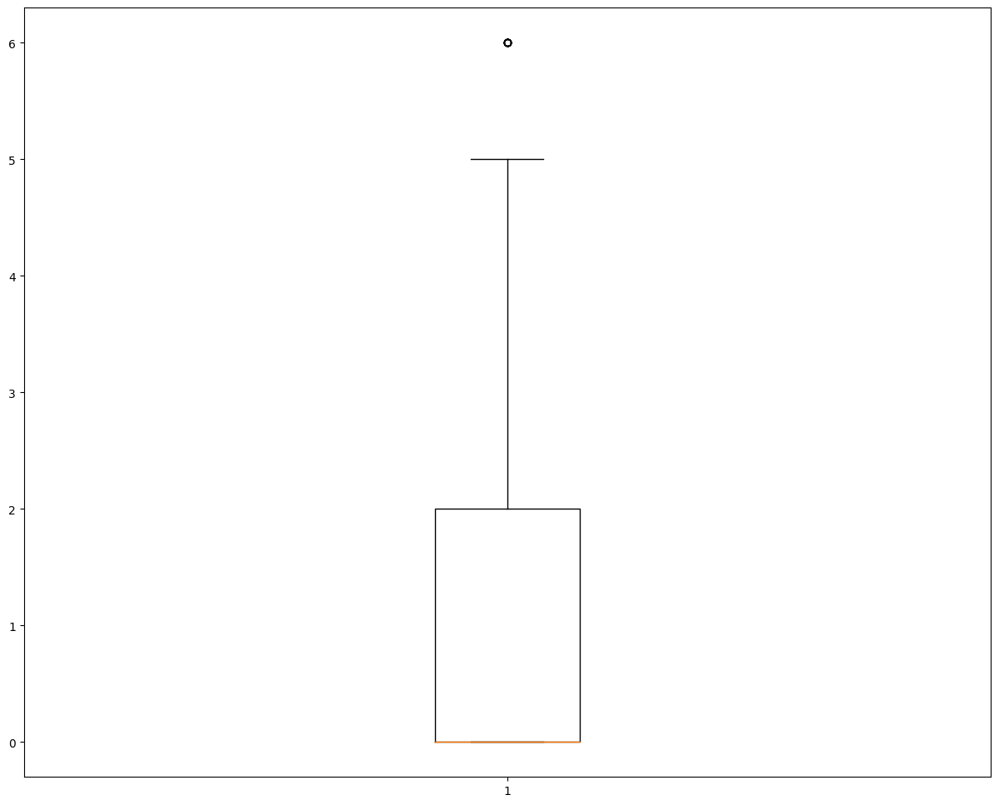

,LSD,LSD_encoded
0,CL2,2
1,CL0,0
10,CL1,1
197,CL3,3
198,CL4,4
649,CL5,5
835,CL6,6


In [29]:
labelEncoder = LabelEncoder()
df_drug_consumption['LSD_encoded'] = labelEncoder.fit_transform(df_drug_consumption['LSD'])
plt.boxplot(df_drug_consumption['LSD_encoded'])
plt.show()
df_drug_consumption[['LSD', 'LSD_encoded']].drop_duplicates()

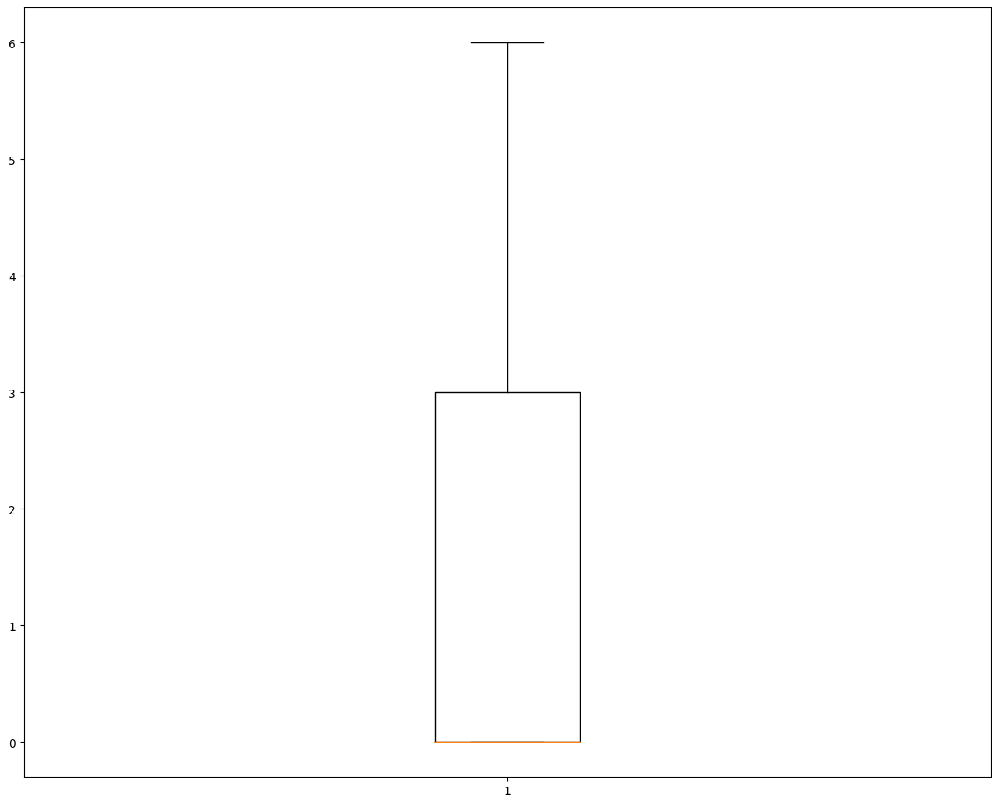

,Ecstasy,Ecstasy_encoded
0,CL4,4
1,CL0,0
3,CL1,1
10,CL3,3
17,CL2,2
198,CL6,6
492,CL5,5


In [30]:
labelEncoder = LabelEncoder()
df_drug_consumption['Ecstasy_encoded'] = labelEncoder.fit_transform(df_drug_consumption['Ecstasy'])
plt.boxplot(df_drug_consumption['Ecstasy_encoded'])
plt.show()
df_drug_consumption[['Ecstasy', 'Ecstasy_encoded']].drop_duplicates()

In [31]:
for cl in ['Nicotine', 'Mushrooms', 'Crack', 'LSD', 'Ecstasy']:
    print(df_drug_consumption[df_drug_consumption[cl]=='CL6'][cl].value_counts())

CL6    610
Name: Nicotine, dtype: int64
CL6    4
Name: Mushrooms, dtype: int64
CL6    2
Name: Crack, dtype: int64
CL6    13
Name: LSD, dtype: int64
CL6    21
Name: Ecstasy, dtype: int64


**Observations:**. 
For all 5 chosen drugs - Nicotine, Mushrooms, Crack, LSD, Ecstasy; the mean rating is closer to CL3 for Nicotine and data is more spread out. For mushrooms, LSD and Ecstasy it seems that people are not using them recently that's why the plot is skewed towards first half of the categories.
Nicotine is the most used drugs in recent times out of all the 5 chosen drugs.

## 3.2

In [32]:
list(df_drug_consumption.columns)

['ID',
 'Age',
 'Gender',
 'Education',
 'Country',
 'Ethnicity',
 'Nscore',
 'Escore',
 'Oscore',
 'AScore',
 'Cscore',
 'Impulsive',
 'SS',
 'Alcohol',
 'Amphet',
 'Amyl',
 'Benzos',
 'Caff',
 'Cannabis',
 'Choc',
 'Coke',
 'Crack',
 'Ecstasy',
 'Heroin',
 'Ketamine',
 'Legalh',
 'LSD',
 'Meth',
 'Mushrooms',
 'Nicotine',
 'Semer',
 'VSA',
 'Nicotine_encoded',
 'Mushrooms_encoded',
 'Crack_encoded',
 'LSD_encoded',
 'Ecstasy_encoded']

In [33]:
all_drugs = ['Alcohol',
 'Amphet',
 'Amyl',
 'Benzos',
 'Caff',
 'Cannabis',
 'Choc',
 'Coke',
 'Crack',
 'Ecstasy',
 'Heroin',
 'Ketamine',
 'Legalh',
 'LSD',
 'Meth',
 'Mushrooms',
 'Nicotine',
 'Semer',
 'VSA']
all_drugs

['Alcohol',
 'Amphet',
 'Amyl',
 'Benzos',
 'Caff',
 'Cannabis',
 'Choc',
 'Coke',
 'Crack',
 'Ecstasy',
 'Heroin',
 'Ketamine',
 'Legalh',
 'LSD',
 'Meth',
 'Mushrooms',
 'Nicotine',
 'Semer',
 'VSA']

In [34]:
df_drug_consumption[df_drug_consumption['Gender']=='F'][all_drugs].describe()

,Alcohol,Amphet,Amyl,Benzos,Caff,Cannabis,Choc,Coke,Crack,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
count,941,941,941,941,941,941,941,941,941,941,941,941,941,941,941,941,941,941,941
unique,7,7,6,7,7,7,6,7,5,7,7,7,7,7,7,7,7,4,7
top,CL5,CL0,CL0,CL0,CL6,CL0,CL6,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0
freq,402,595,712,560,688,295,437,595,850,613,844,815,695,653,788,607,275,936,780


In [35]:
df_drug_consumption[df_drug_consumption['Gender']=='M'][all_drugs].describe()

,Alcohol,Amphet,Amyl,Benzos,Caff,Cannabis,Choc,Coke,Crack,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
count,943,943,943,943,943,943,943,943,943,943,943,943,943,943,943,943,943,943,943
unique,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,3,7
top,CL5,CL0,CL0,CL0,CL6,CL6,CL6,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL6,CL0,CL0
freq,356,381,592,440,696,311,370,442,776,407,760,674,398,415,640,374,369,940,674


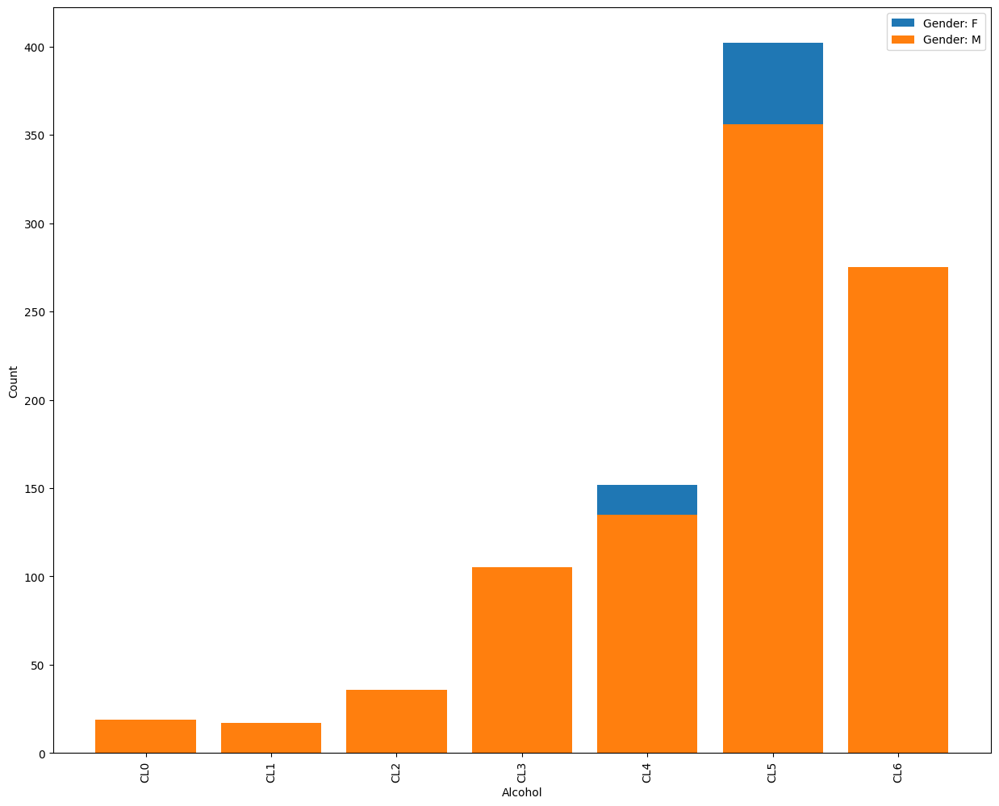

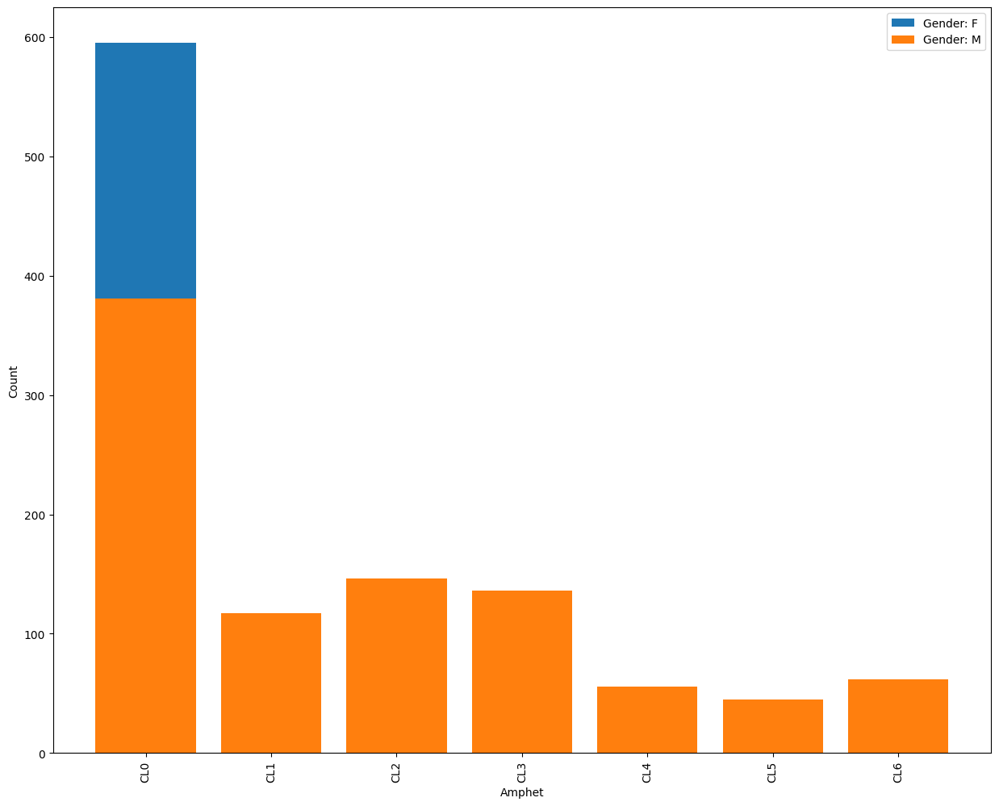

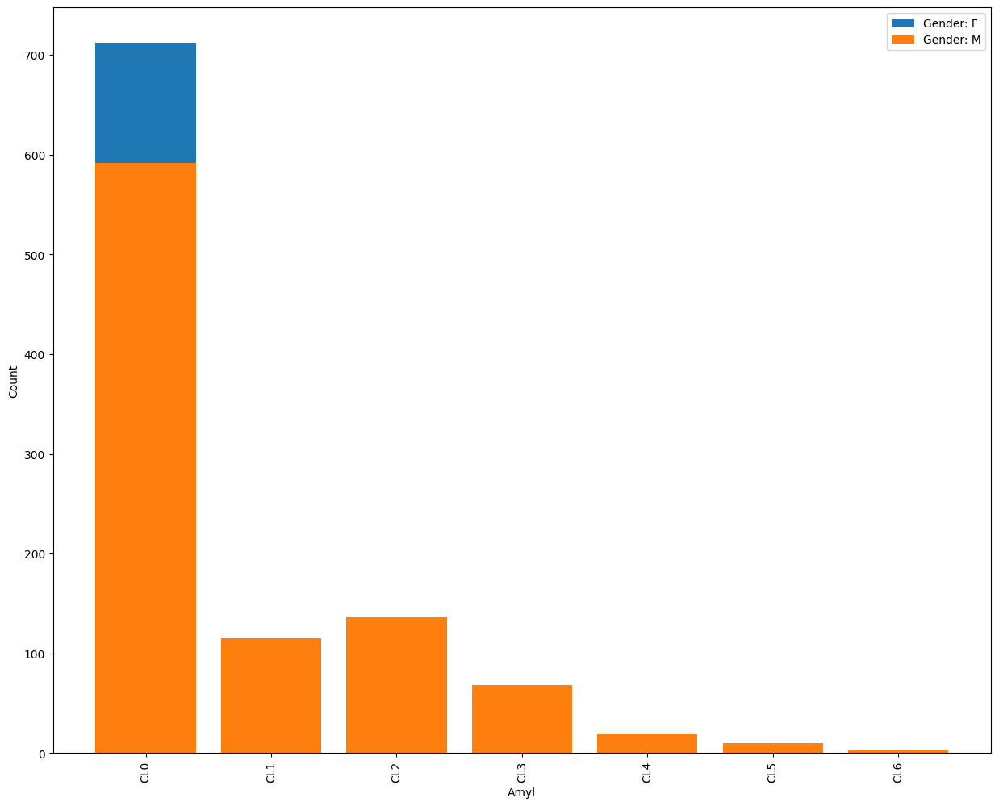

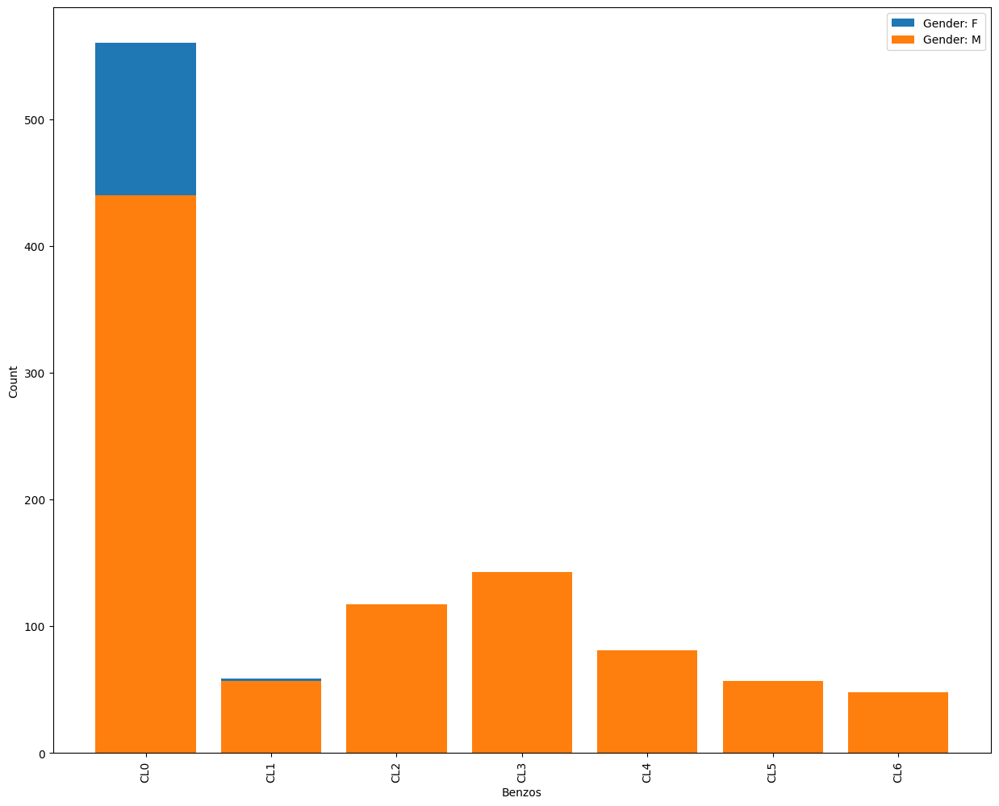

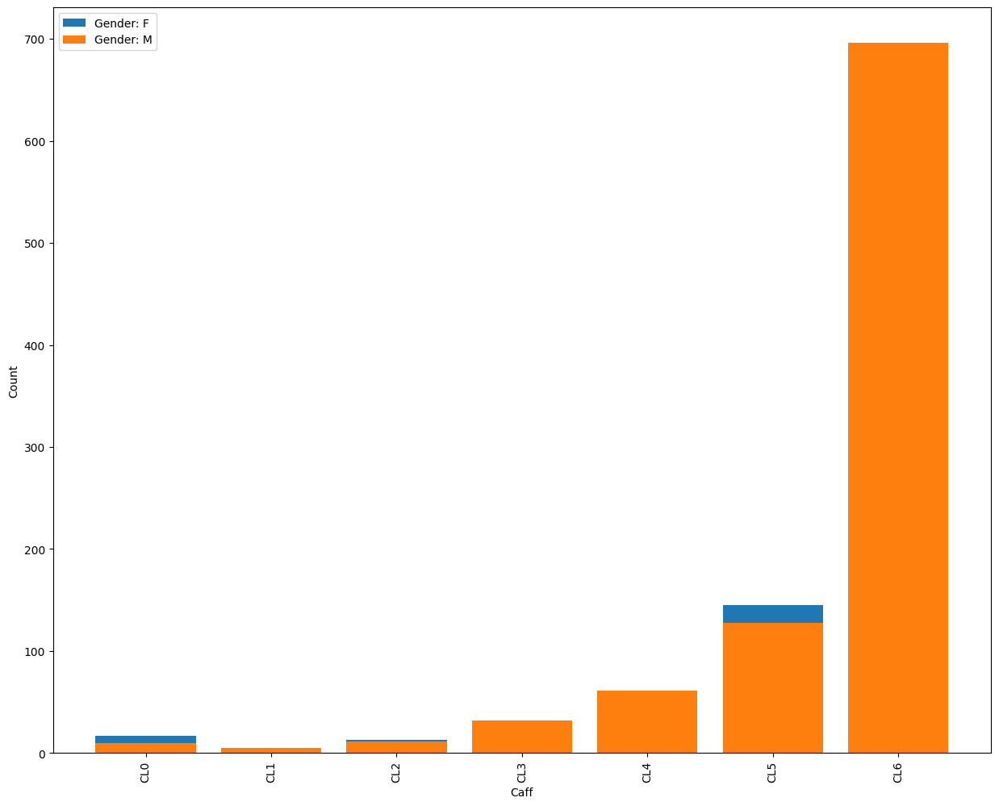

...

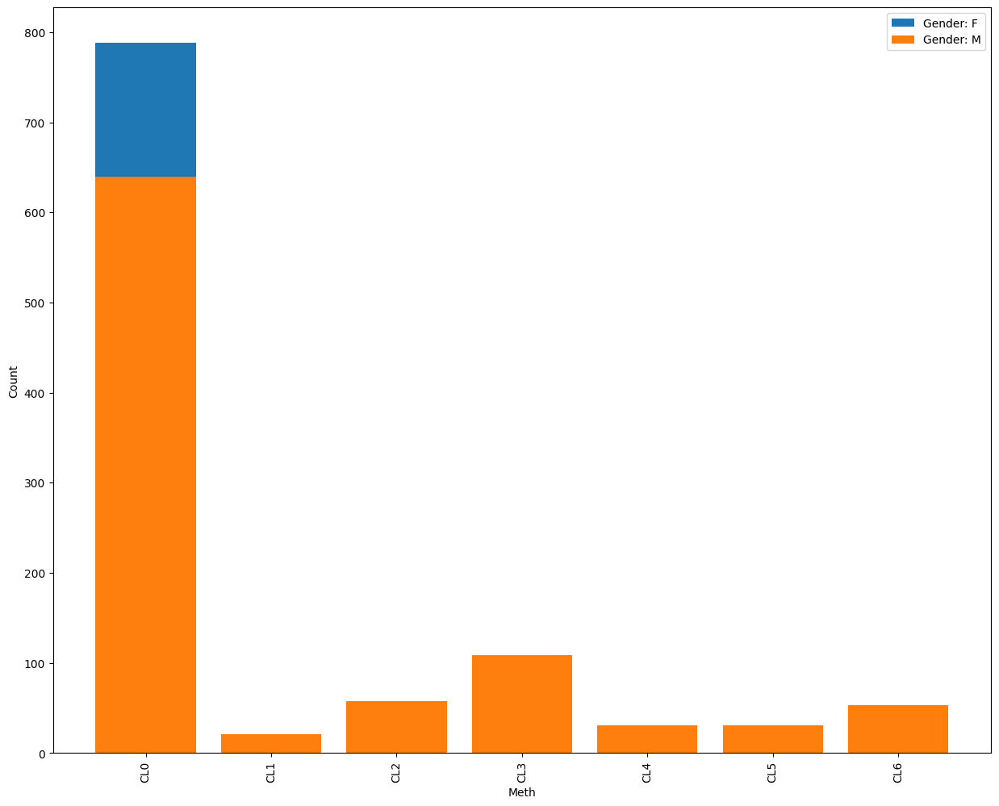

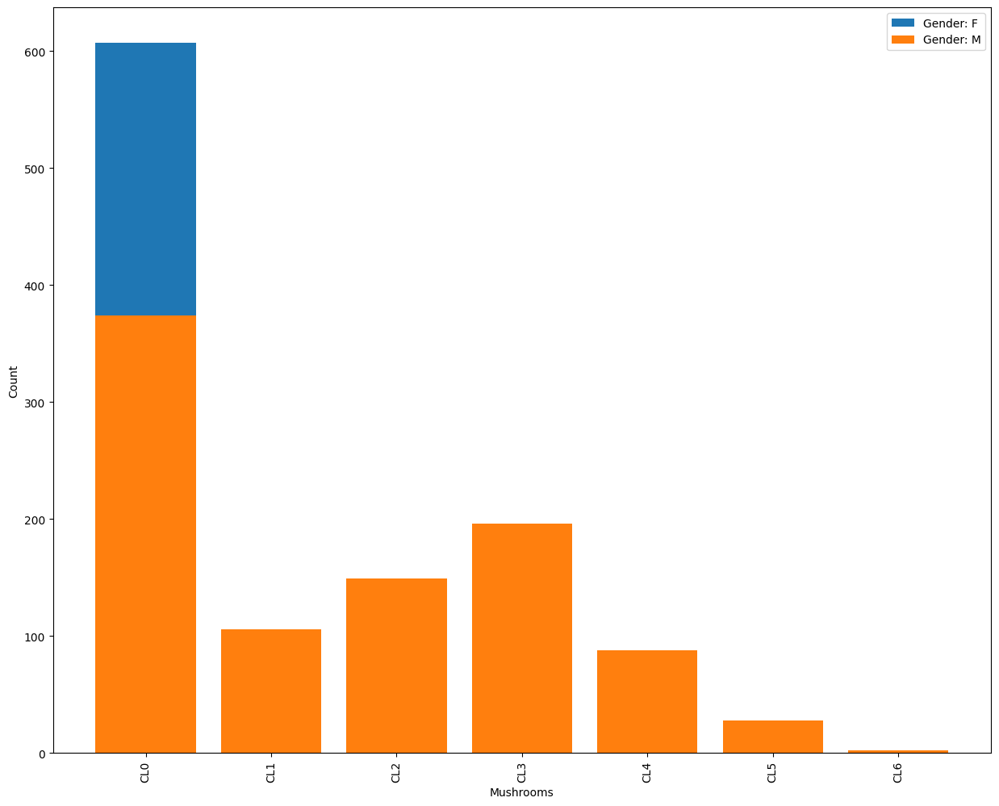

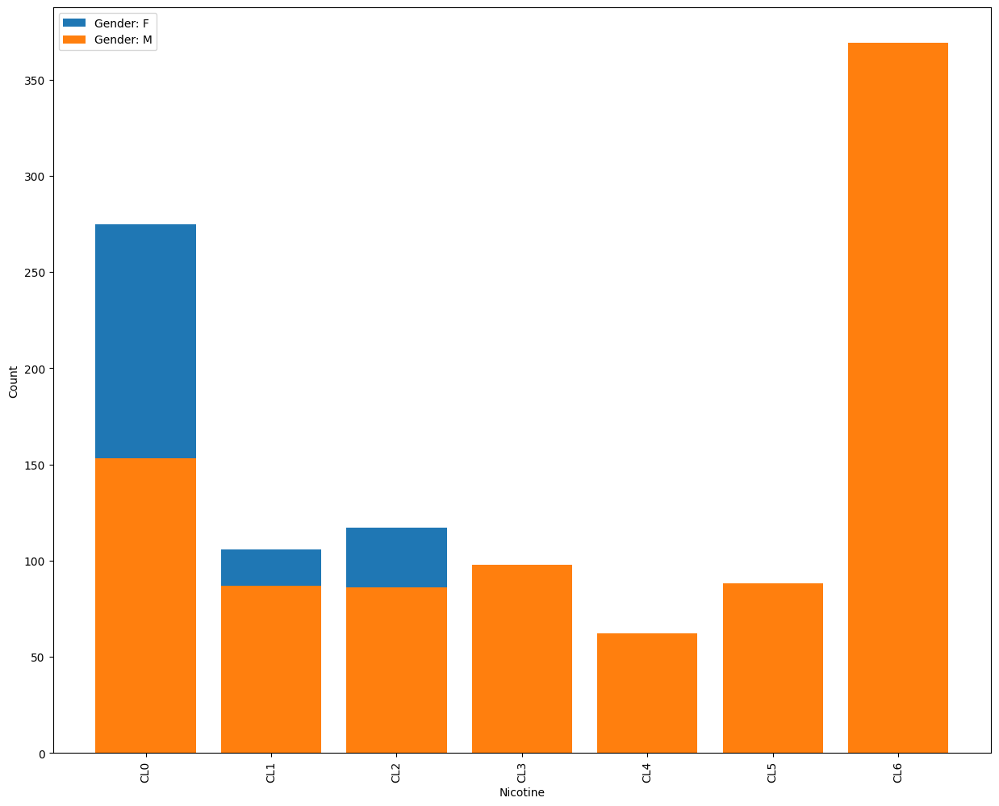

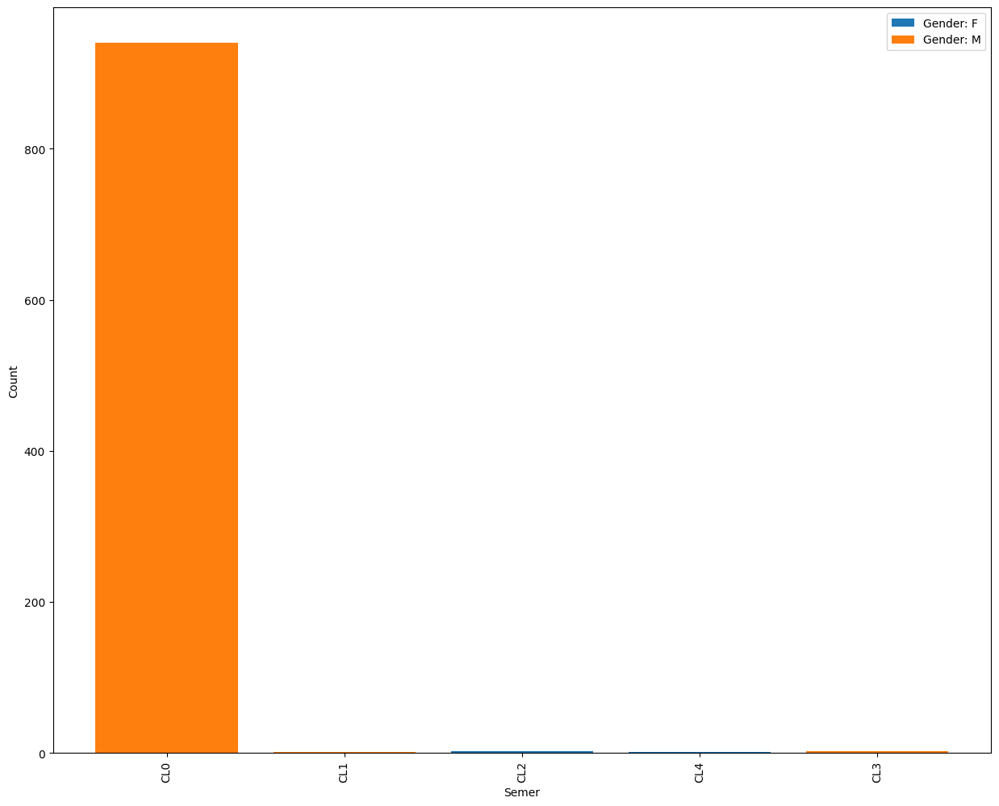

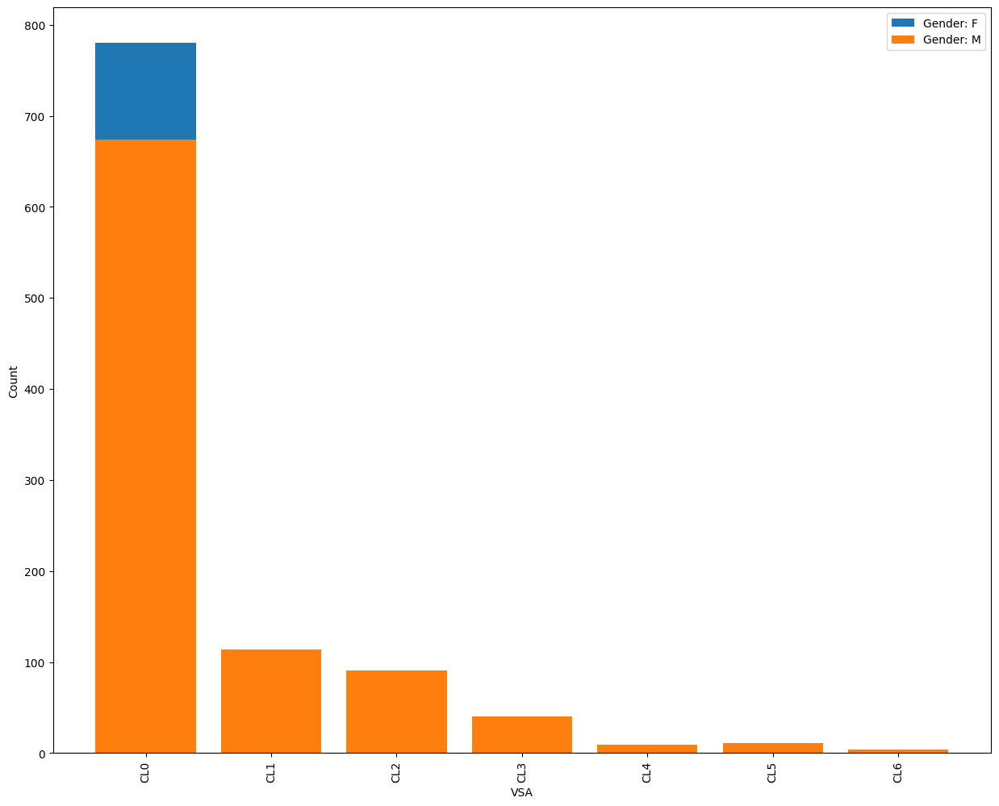

In [36]:
for drug in all_drugs:
    y = df_drug_consumption[df_drug_consumption['Gender']=='F'].groupby(drug).size()
    x = y.index
    plt.bar(x, y, label = 'Gender: F')
    y2 = df_drug_consumption[df_drug_consumption['Gender']=='M'].groupby(drug).size()
    x2 = y2.index
    plt.bar(x2, y2, label = 'Gender: M')
    plt.ylabel('Count')
    plt.xlabel(drug)
    plt.xticks(rotation='vertical')
    plt.legend()
    plt.show()

**Observations:**  
We can see that top recently used drugs by females are - Caff (Caffeine), Choc (Chocolate) and Alcohol, whereas for men it's - Caff, Cannabis, Nicotine and Alcohol. It seems that female do prefer illegal drugs but then that is same with men as well. We can say that majority of population who has taken any kind of drug recently, is not an illegal one.  
Drugs considered illegal for this analysis are - 'Coke', 'Crack', 'Ecstasy', 'Heroin', 'Ketamine', 'Legalh', 'LSD', 'Meth', 'Mushrooms', 'VSA'.

## 3.3

/var/folders/6g/fytkkjps4bv8kzynbpd83_x80000gn/T/ipykernel_27161/3698629413.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  c1=df_drug_consumption.corr()


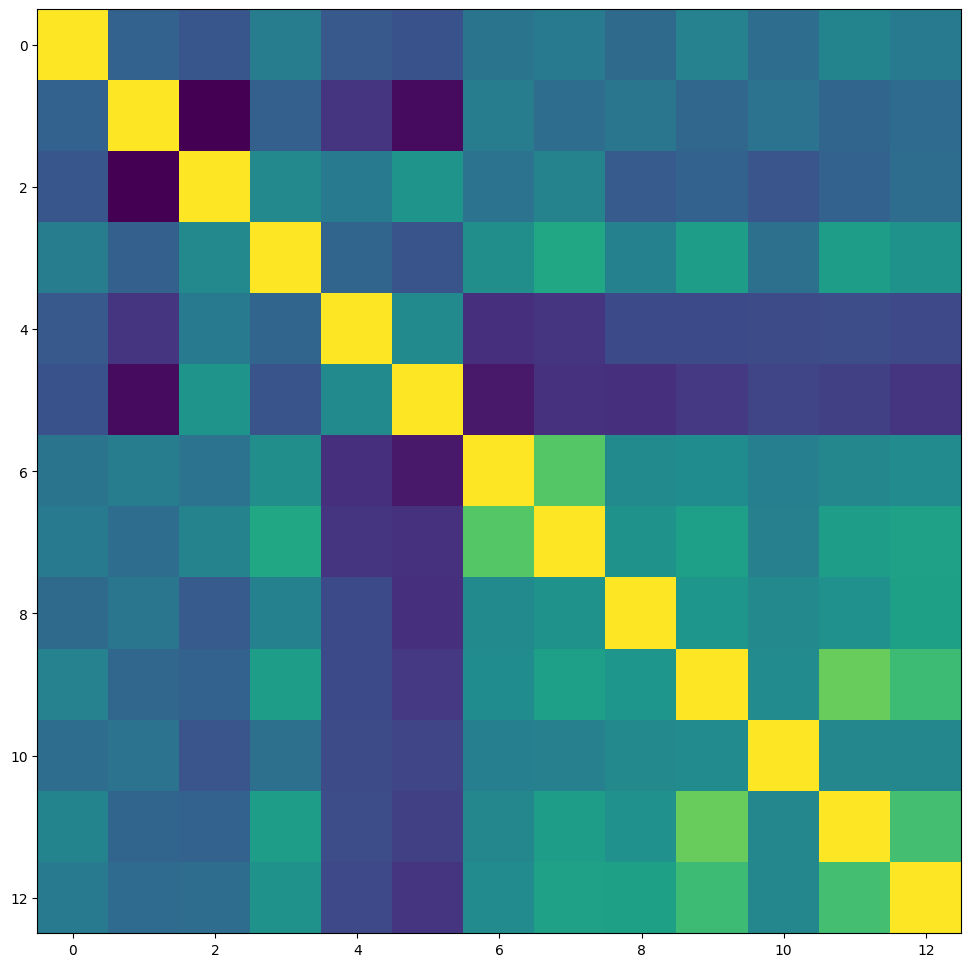

In [37]:
c1=df_drug_consumption.corr()
plt.imshow(c1)

## 3.4

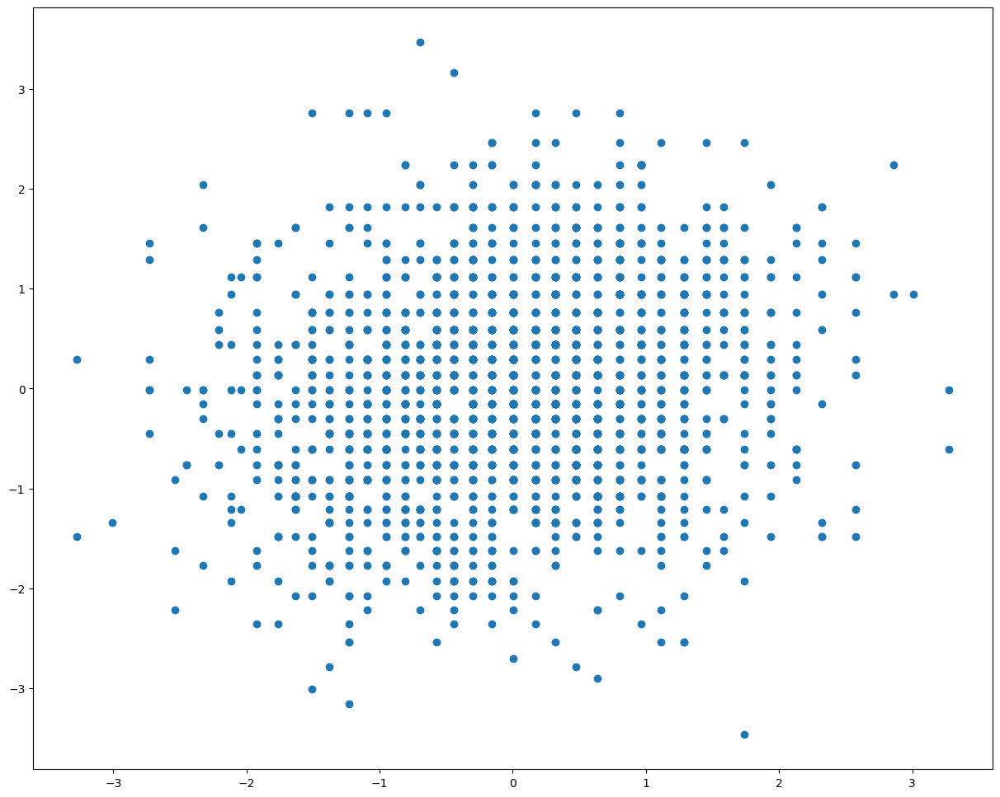

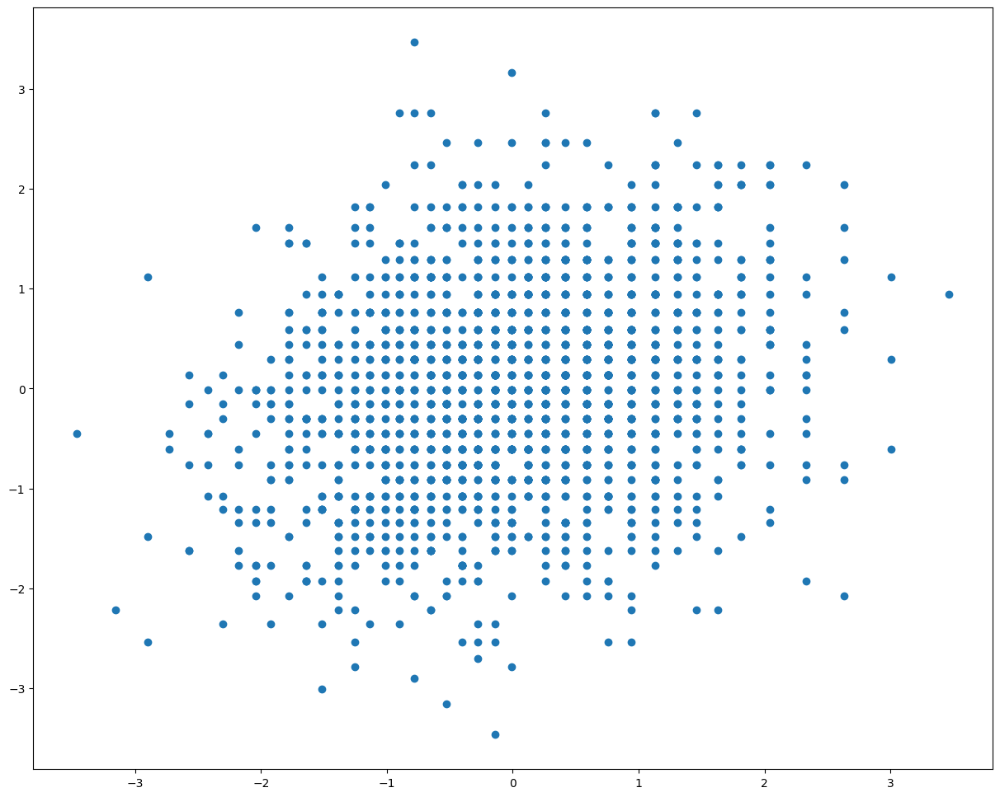

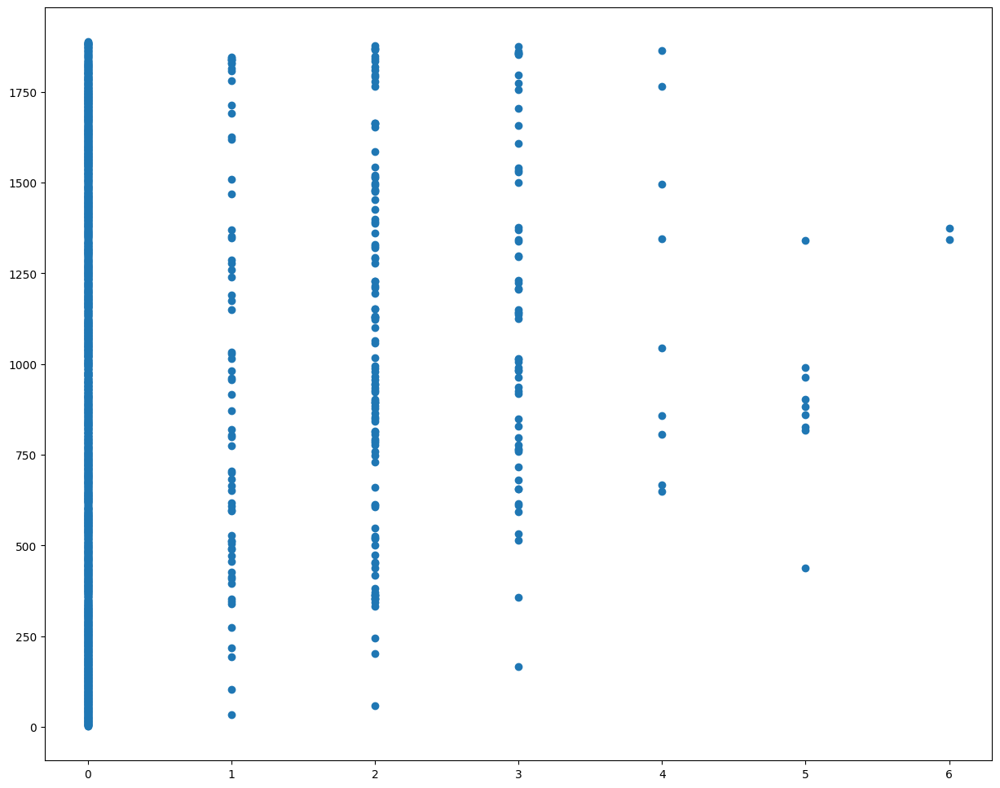

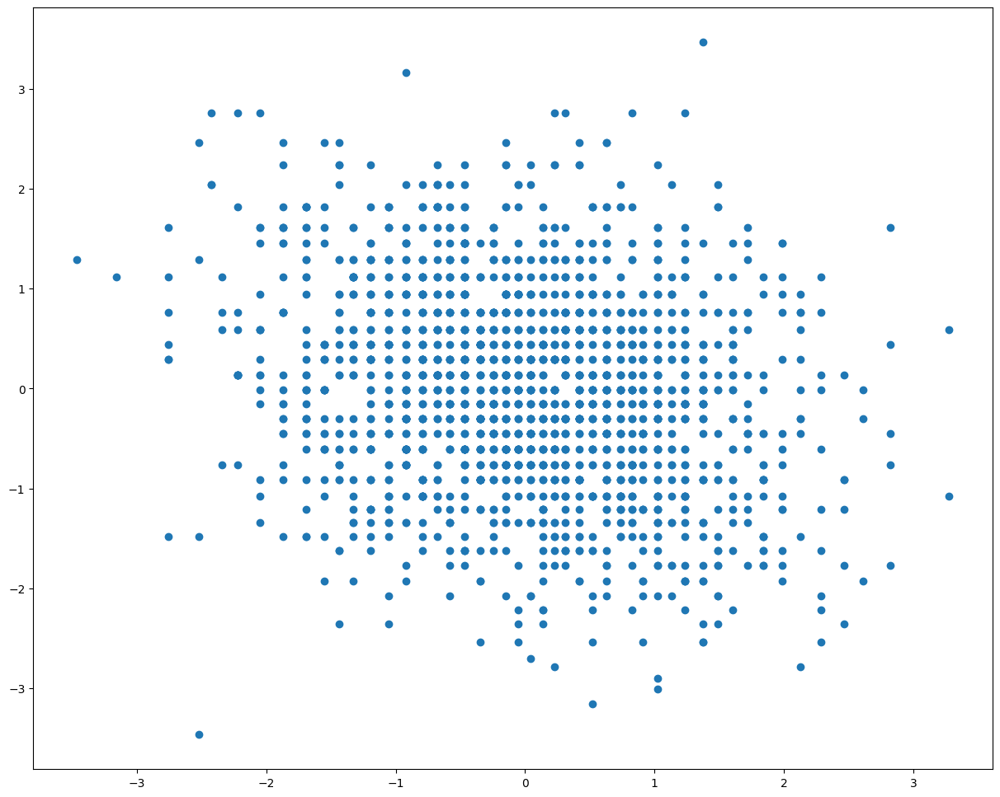

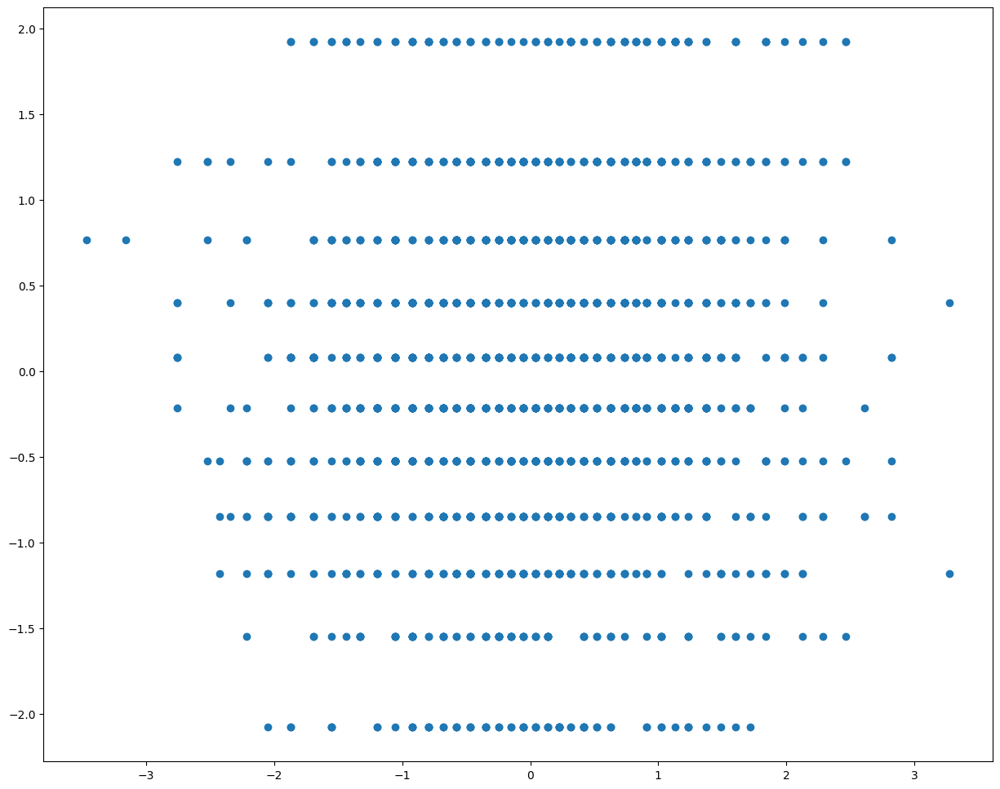

...

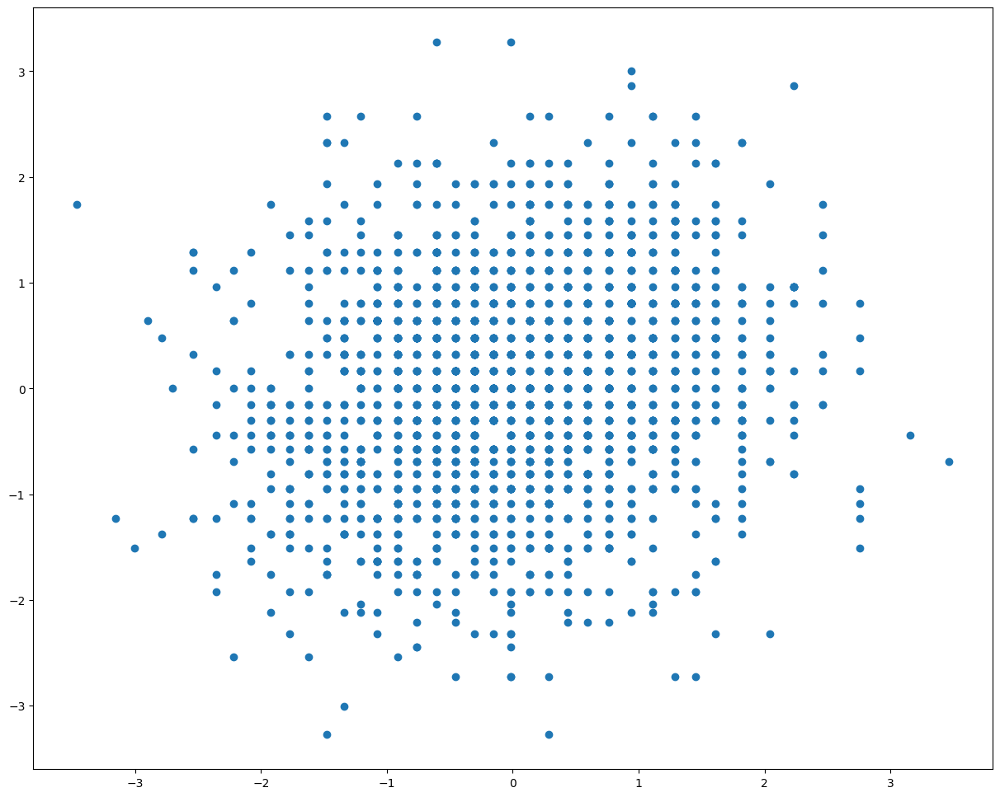

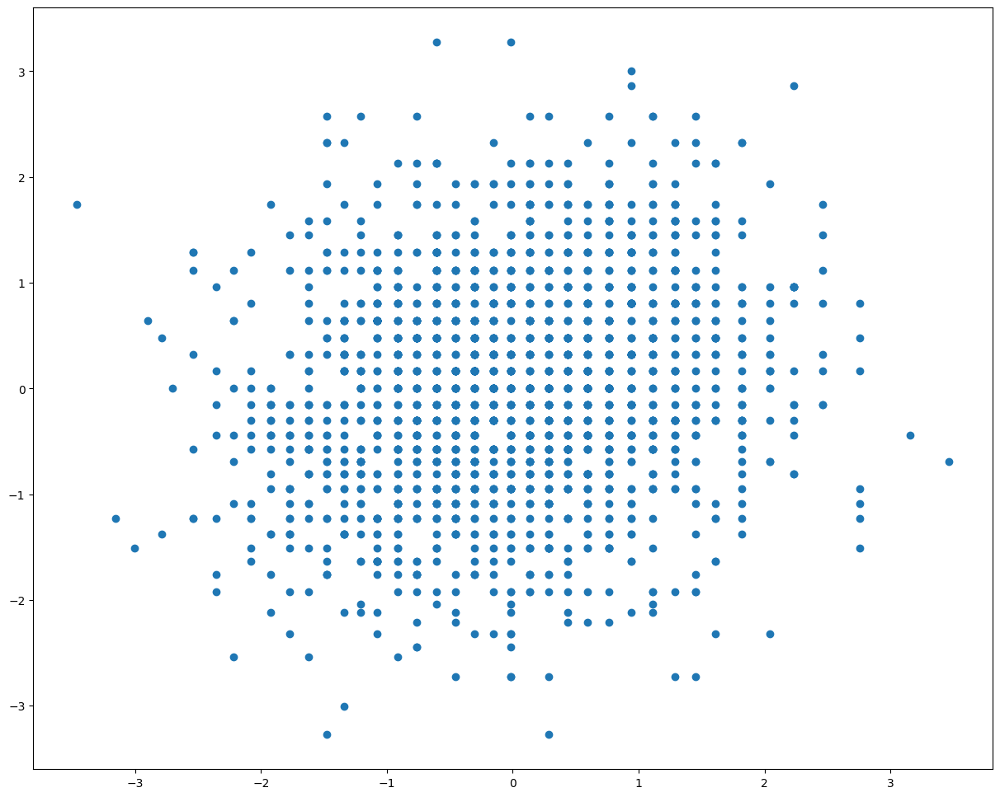

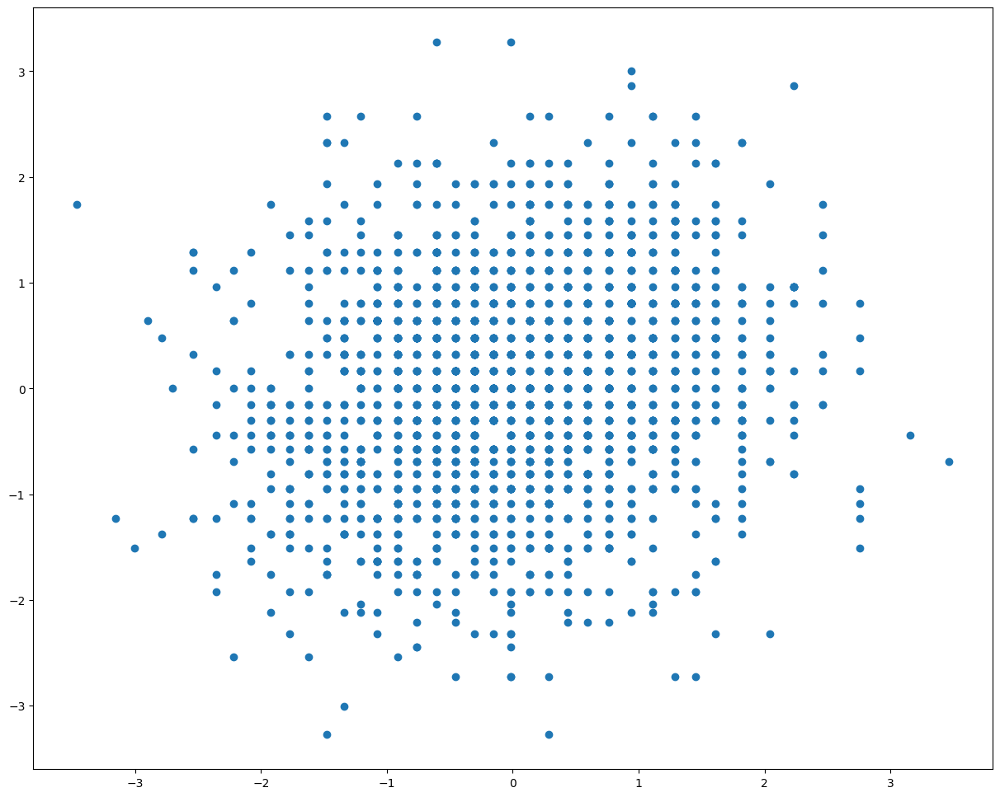

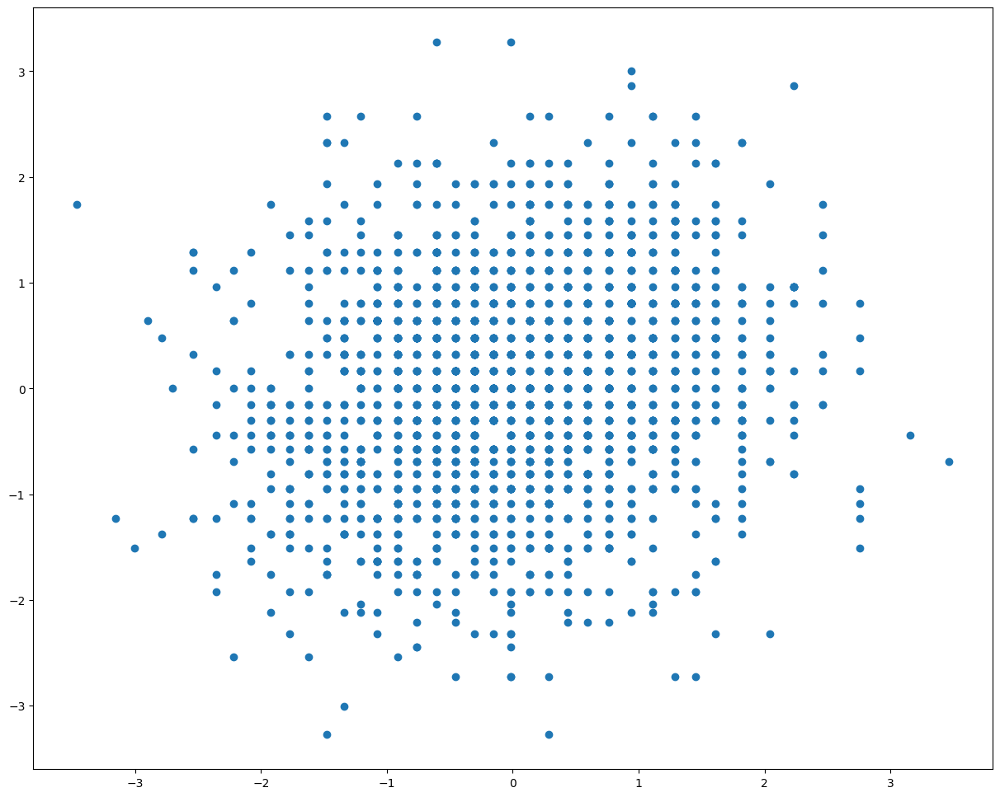

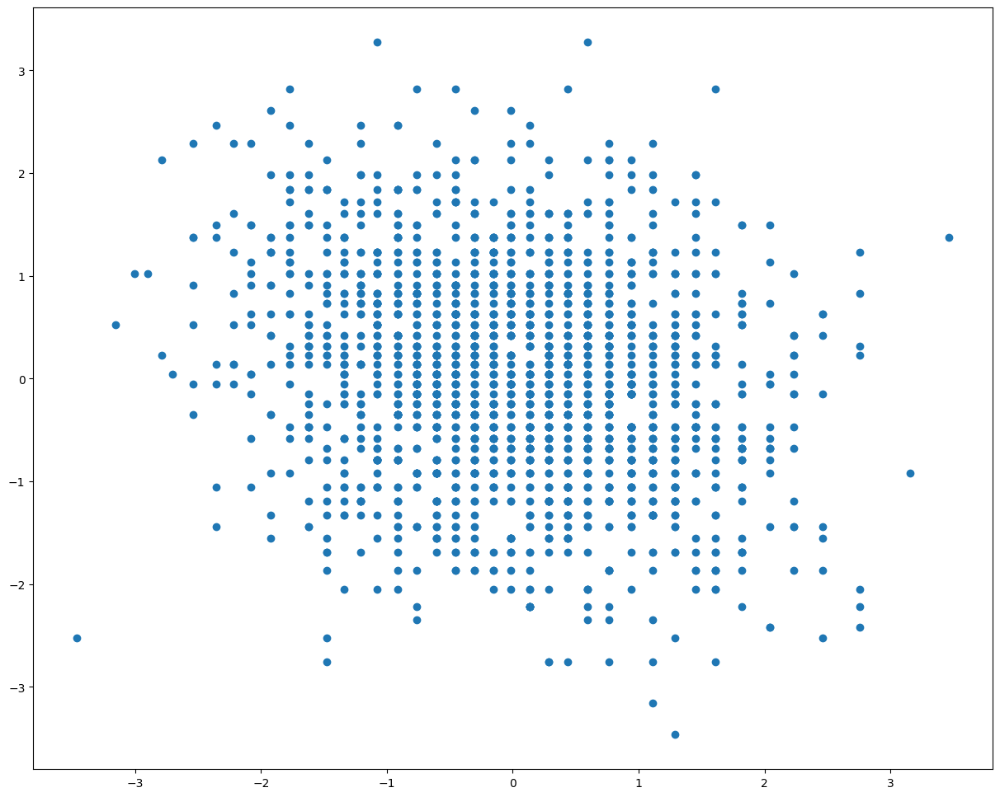

In [38]:
df_numeric_subset = df_drug_consumption._get_numeric_data() 
c1 = df_numeric_subset.corr()
for i, col in enumerate(df_numeric_subset.columns):
    c2 = c1[col].sort_values(ascending=True)[1:3]
    x, y = c2.index
    plt.scatter(x, y, data=df_numeric_subset)
    plt.show()